In [0]:
# importing standard libraries
import io

# importing external libraries

import requests
import numpy as np
import pandas as pd 
import urllib.request
import matplotlib.pyplot as plt
%matplotlib inline

from pyspark.sql.functions import*
import urllib
from pyspark.sql import functions as F
from pyspark.sql.functions import corr




#pip install altair
#import altair as alt


#### Using the Amazon S3 bucket which has the data in it. Establishing a mount with Databricks cluster in order to access the data directly

In [0]:
#Initilializing the Access key and Secret key for AWS
Access_key = ''
Secret_key = ''
# Secret Key and Access key hidden because of a possible disclosure of account sensitive information which could be procured by hackers.
# Please download the data from the github resource provided in readme to access the latest data at hand.
#Encoding the secret key using urllib library
Encoded_key = urllib.parse.quote(Secret_key, "")

In [0]:
Aws_S3_bucket_name = 'covid-data-dump'
Mount_name = "covid-data-retireve"
dbutils.fs.mount("s3a://%s:%s@%s" % (Access_key, Encoded_key, Aws_S3_bucket_name ), "/mnt/%s" % Mount_name )



---------------------------------------------------------------------------
ExecutionError                            Traceback (most recent call last)
<command-516306980648885> in <module>
      1 Aws_S3_bucket_name = 'covid-data-dump'
      2 Mount_name = "covid-data-retireve"
----> 3 dbutils.fs.mount("s3a://%s:%s@%s" % (Access_key, Encoded_key, Aws_S3_bucket_name ), "/mnt/%s" % Mount_name )
      4 

/databricks/python_shell/dbruntime/dbutils.py in f_with_exception_handling(*args, **kwargs)
    387                     exc.__context__ = None
    388                     exc.__cause__ = None
--> 389                     raise exc
    390 
    391             return f_with_exception_handling

ExecutionError: An error occurred while calling o387.mount.
: java.rmi.RemoteException: java.lang.IllegalArgumentException: requirement failed: Directory already mounted: /mnt/covid-data-retireve; nested exception is: 
	java.lang.IllegalArgumentException: requirement failed: Directory already mounte

In [0]:
# Accessing the elements of the S3 bucket using the mount
display(dbutils.fs.ls("/mnt/%s" % Mount_name))


path,name,size,modificationTime
dbfs:/mnt/covid-data-retireve/co-est2019-alldata.csv,co-est2019-alldata.csv,3644730,1651787339000
dbfs:/mnt/covid-data-retireve/people_vaccinated_us_timeline.csv,people_vaccinated_us_timeline.csv,2307506,1651783404000
dbfs:/mnt/covid-data-retireve/us-counties.csv,us-counties.csv,103392573,1651714672000
dbfs:/mnt/covid-data-retireve/us-states.csv,us-states.csv,1546899,1651714673000
dbfs:/mnt/covid-data-retireve/vaccine_people_vaccinated_US.csv,vaccine_people_vaccinated_US.csv,4663,1651714673000


#### Ingest the data into a spark dataframe using read.csv, also the underlying schema gets inherited as of the code snippet

In [0]:
# covid_df_counties_raw = spark.read.csv("dbfs:/FileStore/tables/us_counties.csv", header=True, inferSchema=True)
# The main US counties dataframe
# Supply the local file path if you are trying to run it by loading the local file.
covid_df_counties_raw = spark.read.csv("/mnt/covid-data-retireve/us-counties.csv", header=True, inferSchema=True)
covid_df_counties_raw.show()

+-------------------+-----------+----------+-----+-----+------+
|               date|     county|     state| fips|cases|deaths|
+-------------------+-----------+----------+-----+-----+------+
|2020-01-21 00:00:00|  Snohomish|Washington|53061|    1|     0|
|2020-01-22 00:00:00|  Snohomish|Washington|53061|    1|     0|
|2020-01-23 00:00:00|  Snohomish|Washington|53061|    1|     0|
|2020-01-24 00:00:00|       Cook|  Illinois|17031|    1|     0|
|2020-01-24 00:00:00|  Snohomish|Washington|53061|    1|     0|
|2020-01-25 00:00:00|     Orange|California| 6059|    1|     0|
|2020-01-25 00:00:00|       Cook|  Illinois|17031|    1|     0|
|2020-01-25 00:00:00|  Snohomish|Washington|53061|    1|     0|
|2020-01-26 00:00:00|   Maricopa|   Arizona| 4013|    1|     0|
|2020-01-26 00:00:00|Los Angeles|California| 6037|    1|     0|
|2020-01-26 00:00:00|     Orange|California| 6059|    1|     0|
|2020-01-26 00:00:00|       Cook|  Illinois|17031|    1|     0|
|2020-01-26 00:00:00|  Snohomish|Washing

In [0]:
# The US states daily cases dataframe
# Supply the local file path if you are trying to run it by loading the local file.
covid_df_states_raw = spark.read.csv("/mnt/covid-data-retireve/us-states.csv", header=True, inferSchema=True)
covid_df_states_raw.show()

+-------------------+----------+----+-----+------+
|               date|     state|fips|cases|deaths|
+-------------------+----------+----+-----+------+
|2020-01-21 00:00:00|Washington|  53|    1|     0|
|2020-01-22 00:00:00|Washington|  53|    1|     0|
|2020-01-23 00:00:00|Washington|  53|    1|     0|
|2020-01-24 00:00:00|  Illinois|  17|    1|     0|
|2020-01-24 00:00:00|Washington|  53|    1|     0|
|2020-01-25 00:00:00|California|   6|    1|     0|
|2020-01-25 00:00:00|  Illinois|  17|    1|     0|
|2020-01-25 00:00:00|Washington|  53|    1|     0|
|2020-01-26 00:00:00|   Arizona|   4|    1|     0|
|2020-01-26 00:00:00|California|   6|    2|     0|
|2020-01-26 00:00:00|  Illinois|  17|    1|     0|
|2020-01-26 00:00:00|Washington|  53|    1|     0|
|2020-01-27 00:00:00|   Arizona|   4|    1|     0|
|2020-01-27 00:00:00|California|   6|    2|     0|
|2020-01-27 00:00:00|  Illinois|  17|    1|     0|
|2020-01-27 00:00:00|Washington|  53|    1|     0|
|2020-01-28 00:00:00|   Arizona

In [0]:
covid_df_vaccine_raw = spark.read.csv("/mnt/covid-data-retireve/people_vaccinated_us_timeline.csv", header=True, inferSchema=True)
covid_df_vaccine_raw.show()

+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|FIPS|Province_State|Country_Region|               Date|    Lat|   Long_|Combined_Key|People_Fully_Vaccinated|People_Partially_Vaccinated|
+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|   1|       Alabama|            US|2020-12-10 00:00:00|32.3182|-86.9023| Alabama, US|                   null|                       null|
|   1|       Alabama|            US|2020-12-11 00:00:00|32.3182|-86.9023| Alabama, US|                   null|                       null|
|   1|       Alabama|            US|2020-12-12 00:00:00|32.3182|-86.9023| Alabama, US|                   null|                       null|
|   1|       Alabama|            US|2020-12-13 00:00:00|32.3182|-86.9023| Alabama, US|                   null|                       null|
|   1|       Alabama|      

In [0]:
# Population Estimate dataframe, just in case if needed
population_estimate_raw = spark.read.csv("/mnt/covid-data-retireve/co-est2019-alldata.csv", header=True, inferSchema=True)
population_estimate_raw.show()

+------+------+--------+-----+------+-------+---------------+-------------+-----------------+---------------+---------------+---------------+---------------+---------------+---------------+---------------+---------------+---------------+---------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+----------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+--------------------+---------------+---------------+-----

In [0]:
# Let's see how our ingested data looks like
display(covid_df_counties_raw)

date,county,state,fips,cases,deaths
2020-01-21T00:00:00.000+0000,Snohomish,Washington,53061,1,0
2020-01-22T00:00:00.000+0000,Snohomish,Washington,53061,1,0
2020-01-23T00:00:00.000+0000,Snohomish,Washington,53061,1,0
2020-01-24T00:00:00.000+0000,Cook,Illinois,17031,1,0
2020-01-24T00:00:00.000+0000,Snohomish,Washington,53061,1,0
2020-01-25T00:00:00.000+0000,Orange,California,6059,1,0
2020-01-25T00:00:00.000+0000,Cook,Illinois,17031,1,0
2020-01-25T00:00:00.000+0000,Snohomish,Washington,53061,1,0
2020-01-26T00:00:00.000+0000,Maricopa,Arizona,4013,1,0
2020-01-26T00:00:00.000+0000,Los Angeles,California,6037,1,0


In [0]:
display(covid_df_states_raw)

date,state,fips,cases,deaths
2020-01-21T00:00:00.000+0000,Washington,53,1,0
2020-01-22T00:00:00.000+0000,Washington,53,1,0
2020-01-23T00:00:00.000+0000,Washington,53,1,0
2020-01-24T00:00:00.000+0000,Illinois,17,1,0
2020-01-24T00:00:00.000+0000,Washington,53,1,0
2020-01-25T00:00:00.000+0000,California,6,1,0
2020-01-25T00:00:00.000+0000,Illinois,17,1,0
2020-01-25T00:00:00.000+0000,Washington,53,1,0
2020-01-26T00:00:00.000+0000,Arizona,4,1,0
2020-01-26T00:00:00.000+0000,California,6,2,0


In [0]:
display(covid_df_vaccine_raw)

FIPS,Province_State,Country_Region,Date,Lat,Long_,Combined_Key,People_Fully_Vaccinated,People_Partially_Vaccinated
1,Alabama,US,2020-12-10T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-11T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-12T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-13T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-14T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-15T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-16T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-17T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-18T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-19T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null


#### Data Cleaning begins

In [0]:
# This code snippet shows us the count of rows in each of the following datasets that have been imported 
print(covid_df_counties_raw.count())
print(covid_df_states_raw.count())
print(covid_df_vaccine_raw.count())

2470255
43798
30972


In [0]:
# Understanding the columns present in our county dataset
print(covid_df_counties_raw.columns)
print(covid_df_states_raw)
print(covid_df_vaccine_raw)

['date', 'county', 'state', 'fips', 'cases', 'deaths']
DataFrame[date: timestamp, state: string, fips: int, cases: int, deaths: int]
DataFrame[FIPS: int, Province_State: string, Country_Region: string, Date: timestamp, Lat: double, Long_: double, Combined_Key: string, People_Fully_Vaccinated: int, People_Partially_Vaccinated: int]


In [0]:
#Obtaining summary statistics of the dataset. This describes important statistics like count, mean, standard deviation, minimum and maximum values for each column
covid_df_counties_raw.describe().show()

+-------+---------+-------+------------------+-----------------+------------------+
|summary|   county|  state|              fips|            cases|            deaths|
+-------+---------+-------+------------------+-----------------+------------------+
|  count|  2470255|2470255|           2446960|          2470255|           2413430|
|   mean|     null|   null| 31398.44875968549|9834.536964402461|159.60960085852915|
| stddev|     null|   null|16342.060186459521|46584.11737533772| 814.0903541039571|
|    min|Abbeville|Alabama|              1001|                0|                 0|
|    max|  Ziebach|Wyoming|             78030|          2880521|             40210|
+-------+---------+-------+------------------+-----------------+------------------+



In [0]:
# Understanding the schema of columns in the counties dataframe
covid_df_counties_raw.printSchema()

root
 |-- date: timestamp (nullable = true)
 |-- county: string (nullable = true)
 |-- state: string (nullable = true)
 |-- fips: integer (nullable = true)
 |-- cases: integer (nullable = true)
 |-- deaths: integer (nullable = true)



In [0]:
population_estimate_raw.printSchema()

root
 |-- SUMLEV: integer (nullable = true)
 |-- REGION: integer (nullable = true)
 |-- DIVISION: integer (nullable = true)
 |-- STATE: integer (nullable = true)
 |-- COUNTY: integer (nullable = true)
 |-- STNAME: string (nullable = true)
 |-- CTYNAME: string (nullable = true)
 |-- CENSUS2010POP: integer (nullable = true)
 |-- ESTIMATESBASE2010: integer (nullable = true)
 |-- POPESTIMATE2010: integer (nullable = true)
 |-- POPESTIMATE2011: integer (nullable = true)
 |-- POPESTIMATE2012: integer (nullable = true)
 |-- POPESTIMATE2013: integer (nullable = true)
 |-- POPESTIMATE2014: integer (nullable = true)
 |-- POPESTIMATE2015: integer (nullable = true)
 |-- POPESTIMATE2016: integer (nullable = true)
 |-- POPESTIMATE2017: integer (nullable = true)
 |-- POPESTIMATE2018: integer (nullable = true)
 |-- POPESTIMATE2019: integer (nullable = true)
 |-- NPOPCHG_2010: integer (nullable = true)
 |-- NPOPCHG_2011: integer (nullable = true)
 |-- NPOPCHG_2012: integer (nullable = true)
 |-- NPOPCH

In [0]:
# This shows us the first record of our dataset as e want to know from when the data dates back to, in order to validate our data and know the genuinity of the records.
covid_df_counties_raw.head(1)

Out[22]: [Row(date=datetime.datetime(2020, 1, 21, 0, 0), county='Snohomish', state='Washington', fips=53061, cases=1, deaths=0)]

In [0]:
# Since the dataset has 2463746 rows, we need to understand the data correctly and what exactly are we dealing with. This , the previous code snippet shows us the first record and last record are dated (Jan 21st 2020) and (May 1st 2022) respectively. This, along with some numerical analysis from the github page shows us that this counties dataset has all the data from thr counties since the advent of the pandemic

from pyspark.sql import functions as F
expr = [F.last(col).alias(col) for col in covid_df_counties_raw.columns]
covid_df_counties_raw.agg(*expr).show()

+-------------------+------+-------+-----+-----+------+
|               date|county|  state| fips|cases|deaths|
+-------------------+------+-------+-----+-----+------+
|2022-05-03 00:00:00|Weston|Wyoming|56045| 1589|    18|
+-------------------+------+-------+-----+-----+------+



In [0]:
# We can also understand the correlation among} different columns in the dataframe. The corr() function of spark dataframe can only compare 2 columns and calculate correlation coeffcients, unlike the pandas functionality where correlation amongst each column can be obtained as a matrix for better visualization.
from pyspark.sql.functions import corr
covid_df_counties_raw.select(corr("cases", "deaths")).show()

+-------------------+
|corr(cases, deaths)|
+-------------------+
| 0.8915062130774141|
+-------------------+



In [0]:
from pyspark.sql.functions import corr
covid_df_counties_raw.select(corr("fips", "deaths")).show()

+--------------------+
|  corr(fips, deaths)|
+--------------------+
|-0.05604172997974699|
+--------------------+



In [0]:
from pyspark.sql.functions import corr
covid_df_counties_raw.select(corr("county", "deaths")).show()

+--------------------+
|corr(county, deaths)|
+--------------------+
|                null|
+--------------------+



In [0]:
#Let's try dealing with missing / Null values and duplicate values. Firstly dealing with duplicate values:
#To count the number of duplicate rows in spark dataframe, we'd want to groupby() all the columns and count them, then select the sum of the counts of the rows, which has count greater  than one

import pyspark.sql.functions as funcs
covid_df_counties_raw.groupBy(covid_df_counties_raw.columns)\
    .count()\
    .where(funcs.col('count') > 1)\
    .select(funcs.sum('count'))\
    .show()

+----------+
|sum(count)|
+----------+
|      null|
+----------+



In [0]:
#Let's count the number of missing values and null values in each of the columns respectively.

# from pyspark.sql.functions import isnan, when, count, col
# covid_df_counties_raw.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in covid_df_counties_raw.columns]).show()
# df.select([f.count(f.when((f.isnan(c) | f.col(c).isNull()), c)).alias(c) for c in cols_check]).show()


covid_df_counties_raw.select(*[
    (
        F.count(F.when((F.isnan(c) | F.col(c).isNull()), c)) if t not in ("timestamp", "date")
        else F.count(F.when(F.col(c).isNull(), c))
    ).alias(c)
    for c, t in covid_df_counties_raw.dtypes if c in covid_df_counties_raw.columns
]).show()


# import pyspark.sql.functions as F
# def count_missings(spark_df,sort=True):
#     """
#     Counts number of nulls and nans in each column
#     """
#     df = spark_df.select([F.count(F.when(F.isnan(c) | F.isnull(c), c)).alias(c) for (c,c_type) in spark_df.dtypes if c_type not in ('timestamp', 'string', 'date')]).toPandas()

#     if len(df) == 0:
#         print("There are no any missing values!")
#         return None

#     if sort:
#         return df.rename(index={0: 'count'}).T.sort_values("count",ascending=False)

#     return df


+----+------+-----+-----+-----+------+
|date|county|state| fips|cases|deaths|
+----+------+-----+-----+-----+------+
|   0|     0|    0|23295|    0| 56825|
+----+------+-----+-----+-----+------+



In [0]:
covid_df_counties_raw.select([count(when(col(c).isNull(), c)).alias(c) for c in covid_df_counties_raw.columns]).show()

+----+------+-----+-----+-----+------+
|date|county|state| fips|cases|deaths|
+----+------+-----+-----+-----+------+
|   0|     0|    0|23295|    0| 56825|
+----+------+-----+-----+-----+------+



In [0]:
# rows = covid_df_counties_raw.count()
# summary = covid_df_counties_raw.describe().filter(col("summary") == "count")
# summary.select(*((lit(rows)-col(c)).alias(c) for c in covid_df_counties_raw("county", "state", "fips", "deaths"))).show()
# Checking for null values
covid_df_counties_raw.select(*(sum(col(c).isNull().cast("int")).alias(c) for c in covid_df_counties_raw.columns)).show()

+----+------+-----+-----+-----+------+
|date|county|state| fips|cases|deaths|
+----+------+-----+-----+-----+------+
|   0|     0|    0|23295|    0| 56825|
+----+------+-----+-----+-----+------+



In [0]:
# Counting number of missing values using isnan function.
covid_df_counties_raw.select([count(when(isnan(c), c)).alias(c) for c in covid_df_counties_raw.columns[1:]]).show()


+------+-----+----+-----+------+
|county|state|fips|cases|deaths|
+------+-----+----+-----+------+
|     0|    0|   0|    0|     0|
+------+-----+----+-----+------+



In [0]:
# No Isnan values! Now We can use the conversion to pandas dataframe to re-check the count of null values.
nacounts = covid_df_counties_raw.select([count(when(isnull(c), c)).alias(c) for c in covid_df_counties_raw.columns]).toPandas()
nacounts

# Clearly converting it into pandas and performing operations is computationally more expensive as we can see here.

,date,county,state,fips,cases,deaths
0,0,0,0,23295,0,56825


In [0]:
# We can see the same result by performing operations on the spark dataframe.
covid_df_counties_raw.select([count(when(isnull(c), c)).alias(c) for c in covid_df_counties_raw.columns]).show()

+----+------+-----+-----+-----+------+
|date|county|state| fips|cases|deaths|
+----+------+-----+-----+-----+------+
|   0|     0|    0|23295|    0| 56825|
+----+------+-----+-----+-----+------+



In [0]:
# Let's confirm whether the values are cumulative in nature so that we're sure about how to analyze cases in counties w.r.t. another column.
covid_df_counties_raw.filter(covid_df_counties_raw.county=='Snohomish').show(100)

+-------------------+---------+----------+-----+-----+------+
|               date|   county|     state| fips|cases|deaths|
+-------------------+---------+----------+-----+-----+------+
|2020-01-21 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-22 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-23 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-24 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-25 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-26 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-27 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-28 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-29 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-30 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-01-31 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-02-01 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-02-02 00:00:00|Snohomish|Washington|53061|    1|     0|
|2020-02

In [0]:
# We have seen there are 23295 null values in fips codes column, 56285 null values in deaths. Let's investigate fips codes null values:
covid_df_counties_raw.filter(covid_df_counties_raw.fips.isNull()).show(100)

+-------------------+-------------+--------------+----+-----+------+
|               date|       county|         state|fips|cases|deaths|
+-------------------+-------------+--------------+----+-----+------+
|2020-03-01 00:00:00|New York City|      New York|null|    1|     0|
|2020-03-01 00:00:00|      Unknown|  Rhode Island|null|    2|     0|
|2020-03-02 00:00:00|New York City|      New York|null|    1|     0|
|2020-03-02 00:00:00|      Unknown|  Rhode Island|null|    2|     0|
|2020-03-03 00:00:00|New York City|      New York|null|    2|     0|
|2020-03-03 00:00:00|      Unknown|  Rhode Island|null|    2|     0|
|2020-03-04 00:00:00|New York City|      New York|null|    2|     0|
|2020-03-04 00:00:00|      Unknown|  Rhode Island|null|    2|     0|
|2020-03-05 00:00:00|New York City|      New York|null|    4|     0|
|2020-03-05 00:00:00|      Unknown|  Rhode Island|null|    2|     0|
|2020-03-06 00:00:00|New York City|      New York|null|    5|     0|
|2020-03-06 00:00:00|      Unknown

In [0]:
# We have seen there are 23295 null values in fips codes column, 56285 null values in deaths. Let's investigate deaths null values:
covid_df_counties_raw.filter(covid_df_counties_raw.deaths.isNull()).show(100)

+-------------------+-------------+-----------+-----+-----+------+
|               date|       county|      state| fips|cases|deaths|
+-------------------+-------------+-----------+-----+-----+------+
|2020-05-05 00:00:00|     Adjuntas|Puerto Rico|72001|    3|  null|
|2020-05-05 00:00:00|       Aguada|Puerto Rico|72003|    7|  null|
|2020-05-05 00:00:00|    Aguadilla|Puerto Rico|72005|   11|  null|
|2020-05-05 00:00:00| Aguas Buenas|Puerto Rico|72007|   22|  null|
|2020-05-05 00:00:00|     Aibonito|Puerto Rico|72009|   13|  null|
|2020-05-05 00:00:00|       Anasco|Puerto Rico|72011|    5|  null|
|2020-05-05 00:00:00|      Arecibo|Puerto Rico|72013|   43|  null|
|2020-05-05 00:00:00|       Arroyo|Puerto Rico|72015|    5|  null|
|2020-05-05 00:00:00|  Barceloneta|Puerto Rico|72017|    3|  null|
|2020-05-05 00:00:00| Barranquitas|Puerto Rico|72019|   15|  null|
|2020-05-05 00:00:00|      Bayamon|Puerto Rico|72021|  108|  null|
|2020-05-05 00:00:00|    Cabo Rojo|Puerto Rico|72023|   20|  n

In [0]:
# As we can see there are records with null values in fips codes in certain counties like New York city, and also certain unkown counties in Arkansas, Georgia, Guam , Maine, Lousiana states without the fips ocdes themselves. Such data where in one column has unkown county name and null fips records are to dropeed in order to analyze and excrutiate the best possible results. Let's count the number of unknowns in the county column to understand what we are dealing with:

covid_df_counties_raw.filter(covid_df_counties_raw.county=='Unknown').count()

Out[38]: 21048

#### The 21048 rows have given us a very interesting insight that even though the county column appears clean with no null values, duplicates, missing values, the data has been a data mismatch for 21048 rows having county as null.

#### Let's do an analysis of how many null values are there in deaths and fips codes columns: 
#### a) Null values in death's column constitutes to 2.3 % of all deaths values
#### b) Null values in Fips counties values constitutes to 0.95 % of all fips column values
#### c) Unknown values constitute to about 0.85 % of all County column values.

#### So there are 3 things that are to be taken care of :
#### 1) Clean the rows having null values in the deaths column 
#### 2) Clean the rows having null values in the fips column 
#### 3) Clean the rows having unknown values in the county column.

In [0]:
covid_df_counties_raw_temp = covid_df_counties_raw

In [0]:
covid_df_counties_raw_temp = covid_df_counties_raw_temp.na.fill(value=0, subset=['deaths'])

In [0]:
# We have succesfully cleaned the deaths column, there are no more null values present in the deaths column
covid_df_counties_raw_temp.filter(covid_df_counties_raw_temp.deaths.isNull()).show(100)

+----+------+-----+----+-----+------+
|date|county|state|fips|cases|deaths|
+----+------+-----+----+-----+------+
+----+------+-----+----+-----+------+



#### Now to clean the fips, county columns, I have decided to leave them as it is as they might contain some information, and if these values(null) start skewing with my results, I can always come back and use the fill or dropna(Pandas) method to get rid of them.

In [0]:
# Showing the cleaned data frame in descending order of cases to get the current understanding of the covid cases scenario:
covid_df_counties_raw_temp.sort(covid_df_counties_raw_temp.cases.desc()).show(truncate=False)


+-------------------+-----------+----------+----+-------+------+
|date               |county     |state     |fips|cases  |deaths|
+-------------------+-----------+----------+----+-------+------+
|2022-05-03 00:00:00|Los Angeles|California|6037|2880521|31977 |
|2022-05-02 00:00:00|Los Angeles|California|6037|2878664|31970 |
|2022-04-30 00:00:00|Los Angeles|California|6037|2872907|31959 |
|2022-04-29 00:00:00|Los Angeles|California|6037|2872907|31959 |
|2022-05-01 00:00:00|Los Angeles|California|6037|2872907|31959 |
|2022-04-28 00:00:00|Los Angeles|California|6037|2870489|31959 |
|2022-04-27 00:00:00|Los Angeles|California|6037|2868119|31951 |
|2022-04-26 00:00:00|Los Angeles|California|6037|2866529|31941 |
|2022-04-25 00:00:00|Los Angeles|California|6037|2864988|31938 |
|2022-04-24 00:00:00|Los Angeles|California|6037|2860503|31924 |
|2022-04-23 00:00:00|Los Angeles|California|6037|2860503|31924 |
|2022-04-22 00:00:00|Los Angeles|California|6037|2860503|31924 |
|2022-04-21 00:00:00|Los 

In [0]:
# Showing the cleaned data frame in descending order of cases to get the current understanding of the covid deaths scenario:
covid_df_counties_raw_temp.sort(covid_df_counties_raw_temp.deaths.desc()).show(truncate=False)


+-------------------+-------------+--------+----+-------+------+
|date               |county       |state   |fips|cases  |deaths|
+-------------------+-------------+--------+----+-------+------+
|2022-05-03 00:00:00|New York City|New York|null|2381364|40210 |
|2022-05-02 00:00:00|New York City|New York|null|2378943|40206 |
|2022-04-29 00:00:00|New York City|New York|null|2370380|40199 |
|2022-04-30 00:00:00|New York City|New York|null|2370380|40199 |
|2022-05-01 00:00:00|New York City|New York|null|2370380|40199 |
|2022-04-28 00:00:00|New York City|New York|null|2367263|40193 |
|2022-04-27 00:00:00|New York City|New York|null|2363845|40184 |
|2022-04-26 00:00:00|New York City|New York|null|2362027|40181 |
|2022-04-25 00:00:00|New York City|New York|null|2360368|40174 |
|2022-04-24 00:00:00|New York City|New York|null|2353829|40167 |
|2022-04-23 00:00:00|New York City|New York|null|2353829|40167 |
|2022-04-22 00:00:00|New York City|New York|null|2353829|40167 |
|2022-04-21 00:00:00|New 

In [0]:
# Cleaning the State and Vaccine Dataframes as by using the same procedure. Understanding the states dataframe first
covid_df_states_raw.describe().show()


+-------+-------+------------------+-----------------+------------------+
|summary|  state|              fips|            cases|            deaths|
+-------+-------+------------------+-----------------+------------------+
|  count|  43798|             43798|            43798|             43798|
|   mean|   null|32.128750171240696|554678.3781679529| 8795.043609297229|
| stddev|   null|18.738647332369975|960387.0928987503|13802.456910724166|
|    min|Alabama|                 1|                1|                 0|
|    max|Wyoming|                78|          9262337|             90541|
+-------+-------+------------------+-----------------+------------------+



In [0]:
# Understanding the schema of states dataframe
covid_df_states_raw.printSchema()

root
 |-- date: timestamp (nullable = true)
 |-- state: string (nullable = true)
 |-- fips: integer (nullable = true)
 |-- cases: integer (nullable = true)
 |-- deaths: integer (nullable = true)



In [0]:
# Checking the state dataframe for duplicates. Again luckily we can see that there are no duplicates in this dataframe.

import pyspark.sql.functions as funcs
covid_df_states_raw.groupBy(covid_df_states_raw.columns)\
    .count()\
    .where(funcs.col('count') > 1)\
    .select(funcs.sum('count'))\
    .show()

+----------+
|sum(count)|
+----------+
|      null|
+----------+



In [0]:
# Checking for Null Values in States dataframe
covid_df_states_raw.select([count(when(col(c).isNull(), c)).alias(c) for c in covid_df_states_raw.columns]).show()


+----+-----+----+-----+------+
|date|state|fips|cases|deaths|
+----+-----+----+-----+------+
|   0|    0|   0|    0|     0|
+----+-----+----+-----+------+



In [0]:
# Checking the states dataframe for Nan Values
covid_df_states_raw.select([count(when(isnan(c), c)).alias(c) for c in covid_df_states_raw.columns[1:]]).show()

+-----+----+-----+------+
|state|fips|cases|deaths|
+-----+----+-----+------+
|    0|   0|    0|     0|
+-----+----+-----+------+



In [0]:
# Now following the same plan for vaccine dataframe
covid_df_vaccine_raw.describe().show()


+-------+------------------+--------------+--------------+------------------+------------------+------------+-----------------------+---------------------------+
|summary|              FIPS|Province_State|Country_Region|               Lat|             Long_|Combined_Key|People_Fully_Vaccinated|People_Partially_Vaccinated|
+-------+------------------+--------------+--------------+------------------+------------------+------------+-----------------------+---------------------------+
|  count|             28616|         30972|         30972|             28616|             28616|       30972|                  28613|                      27931|
|   mean|32.535714285714285|          null|          null|36.840089285724396|-85.20661428570747|        null|     2617842.5068325587|          586294.1412409152|
| stddev| 18.90513346399015|          null|          null|10.789580394566652|49.309073400816175|        null|      3829565.270584286|          899160.6383406664|
|    min|                 1|

In [0]:
# Understanding the schema of vaccine dataframe
covid_df_vaccine_raw.printSchema()

root
 |-- FIPS: integer (nullable = true)
 |-- Province_State: string (nullable = true)
 |-- Country_Region: string (nullable = true)
 |-- Date: timestamp (nullable = true)
 |-- Lat: double (nullable = true)
 |-- Long_: double (nullable = true)
 |-- Combined_Key: string (nullable = true)
 |-- People_Fully_Vaccinated: integer (nullable = true)
 |-- People_Partially_Vaccinated: integer (nullable = true)



In [0]:
# Checking the vaccine dataframe for duplicates. Again luckily we can see that there are no duplicates in this dataframe.

import pyspark.sql.functions as funcs
covid_df_vaccine_raw.groupBy(covid_df_vaccine_raw.columns)\
    .count()\
    .where(funcs.col('count') > 1)\
    .select(funcs.sum('count'))\
    .show()

+----------+
|sum(count)|
+----------+
|      null|
+----------+



In [0]:
# Checking for Null Values in Vaccine dataframe
covid_df_vaccine_raw.select([count(when(col(c).isNull(), c)).alias(c) for c in covid_df_vaccine_raw.columns]).show()


+----+--------------+--------------+----+----+-----+------------+-----------------------+---------------------------+
|FIPS|Province_State|Country_Region|Date| Lat|Long_|Combined_Key|People_Fully_Vaccinated|People_Partially_Vaccinated|
+----+--------------+--------------+----+----+-----+------------+-----------------------+---------------------------+
|2356|             0|             0|   0|2356| 2356|           0|                   2359|                       3041|
+----+--------------+--------------+----+----+-----+------------+-----------------------+---------------------------+



In [0]:
# We can see that there are 2359 Null values in Fully VAccinated column and 3041 Null values in partially vaccinated columns 
covid_df_vaccine_raw.display()

FIPS,Province_State,Country_Region,Date,Lat,Long_,Combined_Key,People_Fully_Vaccinated,People_Partially_Vaccinated
1,Alabama,US,2020-12-10T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-11T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-12T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-13T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-14T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-15T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-16T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-17T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-18T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1,Alabama,US,2020-12-19T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null


In [0]:
covid_df_states_raw.display()

date,state,fips,cases,deaths
2020-01-21T00:00:00.000+0000,Washington,53,1,0
2020-01-22T00:00:00.000+0000,Washington,53,1,0
2020-01-23T00:00:00.000+0000,Washington,53,1,0
2020-01-24T00:00:00.000+0000,Illinois,17,1,0
2020-01-24T00:00:00.000+0000,Washington,53,1,0
2020-01-25T00:00:00.000+0000,California,6,1,0
2020-01-25T00:00:00.000+0000,Illinois,17,1,0
2020-01-25T00:00:00.000+0000,Washington,53,1,0
2020-01-26T00:00:00.000+0000,Arizona,4,1,0
2020-01-26T00:00:00.000+0000,California,6,2,0


In [0]:
pandas_df_vaccine = covid_df_vaccine_raw.toPandas()
pandas_df_vaccine.display()

FIPS,Province_State,Country_Region,Date,Lat,Long_,Combined_Key,People_Fully_Vaccinated,People_Partially_Vaccinated
1.0,Alabama,US,2020-12-10T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-11T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-12T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-13T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-14T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-15T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-16T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-17T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-18T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null
1.0,Alabama,US,2020-12-19T00:00:00.000+0000,32.3182,-86.9023,"Alabama, US",null,null


In [0]:
pandas_df_vaccine['People_Fully_Vaccinated'] = pandas_df_vaccine['People_Fully_Vaccinated'].fillna(0)
print(pandas_df_vaccine)


       FIPS Province_State Country_Region       Date      Lat     Long_  \
0       1.0        Alabama             US 2020-12-10  32.3182  -86.9023   
1       1.0        Alabama             US 2020-12-11  32.3182  -86.9023   
2       1.0        Alabama             US 2020-12-12  32.3182  -86.9023   
3       1.0        Alabama             US 2020-12-13  32.3182  -86.9023   
4       1.0        Alabama             US 2020-12-14  32.3182  -86.9023   
...     ...            ...            ...        ...      ...       ...   
30967  56.0        Wyoming             US 2022-04-30  42.7560 -107.3025   
30968  56.0        Wyoming             US 2022-05-01  42.7560 -107.3025   
30969  56.0        Wyoming             US 2022-05-02  42.7560 -107.3025   
30970  56.0        Wyoming             US 2022-05-03  42.7560 -107.3025   
30971  56.0        Wyoming             US 2022-05-04  42.7560 -107.3025   

      Combined_Key  People_Fully_Vaccinated  People_Partially_Vaccinated  
0      Alabama, US      

In [0]:
pandas_df_vaccine['People_Partially_Vaccinated'] = pandas_df_vaccine['People_Partially_Vaccinated'].fillna(0)
print(pandas_df_vaccine)

       FIPS Province_State Country_Region       Date      Lat     Long_  \
0       1.0        Alabama             US 2020-12-10  32.3182  -86.9023   
1       1.0        Alabama             US 2020-12-11  32.3182  -86.9023   
2       1.0        Alabama             US 2020-12-12  32.3182  -86.9023   
3       1.0        Alabama             US 2020-12-13  32.3182  -86.9023   
4       1.0        Alabama             US 2020-12-14  32.3182  -86.9023   
...     ...            ...            ...        ...      ...       ...   
30967  56.0        Wyoming             US 2022-04-30  42.7560 -107.3025   
30968  56.0        Wyoming             US 2022-05-01  42.7560 -107.3025   
30969  56.0        Wyoming             US 2022-05-02  42.7560 -107.3025   
30970  56.0        Wyoming             US 2022-05-03  42.7560 -107.3025   
30971  56.0        Wyoming             US 2022-05-04  42.7560 -107.3025   

      Combined_Key  People_Fully_Vaccinated  People_Partially_Vaccinated  
0      Alabama, US      

In [0]:
# LEt's clean the Vaccine dataframe, initially by imputing 0 for all null values in people fully vaccinated, partially vaccinated column as Vaccines were not there during that time.

#covid_df_vaccine_temp = covid_df_vaccine_raw.copy()
#covid_df_vaccine_raw = covid_df_vaccine_raw.na.fill(value=0,subset=["People_Fully_Vaccinated"]).show()

covid_df_vaccine_raw.na.fill(value=0, subset=['People_Fully_Vaccinated']).show()



+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|FIPS|Province_State|Country_Region|               Date|    Lat|   Long_|Combined_Key|People_Fully_Vaccinated|People_Partially_Vaccinated|
+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|   1|       Alabama|            US|2020-12-10 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                       null|
|   1|       Alabama|            US|2020-12-11 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                       null|
|   1|       Alabama|            US|2020-12-12 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                       null|
|   1|       Alabama|            US|2020-12-13 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                       null|
|   1|       Alabama|      

In [0]:
# covid_df_vaccine_raw = covid_df_vaccine_raw.na.fill(value=0,subset=["People_Partially_Vaccinated"]).show()
covid_df_vaccine_raw = covid_df_vaccine_raw.na.fill(value=0, subset=['People_Fully_Vaccinated', 'People_Partially_Vaccinated']).show()


+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|FIPS|Province_State|Country_Region|               Date|    Lat|   Long_|Combined_Key|People_Fully_Vaccinated|People_Partially_Vaccinated|
+----+--------------+--------------+-------------------+-------+--------+------------+-----------------------+---------------------------+
|   1|       Alabama|            US|2020-12-10 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                          0|
|   1|       Alabama|            US|2020-12-11 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                          0|
|   1|       Alabama|            US|2020-12-12 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                          0|
|   1|       Alabama|            US|2020-12-13 00:00:00|32.3182|-86.9023| Alabama, US|                      0|                          0|
|   1|       Alabama|      

In [0]:
pandas_df_states = covid_df_states_raw.toPandas()
pandas_df_states.display()

date,state,fips,cases,deaths
2020-01-21T00:00:00.000+0000,Washington,53,1,0
2020-01-22T00:00:00.000+0000,Washington,53,1,0
2020-01-23T00:00:00.000+0000,Washington,53,1,0
2020-01-24T00:00:00.000+0000,Illinois,17,1,0
2020-01-24T00:00:00.000+0000,Washington,53,1,0
2020-01-25T00:00:00.000+0000,California,6,1,0
2020-01-25T00:00:00.000+0000,Illinois,17,1,0
2020-01-25T00:00:00.000+0000,Washington,53,1,0
2020-01-26T00:00:00.000+0000,Arizona,4,1,0
2020-01-26T00:00:00.000+0000,California,6,2,0


In [0]:
pandas_df_states.rename(columns = {'fips':'FIPS', 'DATE':'date', 'state': 'Province_State'}, inplace = True)
print(pandas_df_states)

            date Province_State  FIPS    cases  deaths
0     2020-01-21     Washington    53        1       0
1     2020-01-22     Washington    53        1       0
2     2020-01-23     Washington    53        1       0
3     2020-01-24       Illinois    17        1       0
4     2020-01-24     Washington    53        1       0
...          ...            ...   ...      ...     ...
43793 2022-05-03       Virginia    51  1707085   20247
43794 2022-05-03     Washington    53  1510618   12750
43795 2022-05-03  West Virginia    54   501968    6870
43796 2022-05-03      Wisconsin    55  1615334   14424
43797 2022-05-03        Wyoming    56   156745    1814

[43798 rows x 5 columns]


In [0]:
vaccine_state_outer = pd.merge(pandas_df_states, pandas_df_vaccine, how="outer", on=["FIPS", 'Province_State'])
vaccine_state_outer.display()

date,Province_State,FIPS,cases,deaths,Country_Region,Date,Lat,Long_,Combined_Key,People_Fully_Vaccinated,People_Partially_Vaccinated
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-10T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-11T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-12T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-13T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-14T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-15T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-16T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-17T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-18T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,US,2020-12-19T00:00:00.000+0000,47.4009,-121.4905,"Washington, US",0.0,0.0


In [0]:
vaccine_state_outer = vaccine_state_outer.drop(['Lat', 'Long_', 'Country_Region', 'Combined_Key'], axis = 1)
vaccine_state_outer.display()

date,Province_State,FIPS,cases,deaths,Date,People_Fully_Vaccinated,People_Partially_Vaccinated
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-10T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-11T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-12T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-13T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-14T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-15T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-16T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-17T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-18T00:00:00.000+0000,0.0,0.0
2020-01-21T00:00:00.000+0000,Washington,53.0,1.0,0.0,2020-12-19T00:00:00.000+0000,0.0,0.0


In [0]:
vaccine_state_outer.isna().sum()
# We can see there are 2356 null values in our vaccine dataframe. Let'd check the shape of our dataframe to understand whether we can take the decision to drop these rows

Out[64]: date                           2356
Province_State                    0
FIPS                           2356
cases                          2356
deaths                         2356
Date                              0
People_Fully_Vaccinated           0
People_Partially_Vaccinated       0
dtype: int64

In [0]:
vaccine_state_outer.shape
# Let's check the shape of the dataframe, since it is 22383134, dropping 2356 records out of these. This is less than 0.1 percent, so we can take the decision of dropping them.

Out[65]: (22383134, 8)

In [0]:
df3 = vaccine_state_outer.dropna()
df3.shape


Out[66]: (22380778, 8)

In [0]:
# LEt's check for any null values: Yes, we have completely cleaned the combined dataset. Now we can move onto analysis.
df3.isnull().sum()


Out[67]: date                           0
Province_State                 0
FIPS                           0
cases                          0
deaths                         0
Date                           0
People_Fully_Vaccinated        0
People_Partially_Vaccinated    0
dtype: int64

In [0]:
# LEt's visualie all the unique states in the dataframe
df3['Province_State'].unique()

Out[68]: array(['Washington', 'Illinois', 'California', 'Arizona', 'Massachusetts',
       'Wisconsin', 'Texas', 'Nebraska', 'Utah', 'Oregon', 'Florida',
       'New York', 'Rhode Island', 'Georgia', 'New Hampshire',
       'North Carolina', 'New Jersey', 'Colorado', 'Maryland', 'Nevada',
       'Tennessee', 'Hawaii', 'Indiana', 'Kentucky', 'Minnesota',
       'Oklahoma', 'Pennsylvania', 'South Carolina',
       'District of Columbia', 'Kansas', 'Missouri', 'Vermont',
       'Virginia', 'Connecticut', 'Iowa', 'Louisiana', 'Ohio', 'Michigan',
       'South Dakota', 'Arkansas', 'Delaware', 'Mississippi',
       'New Mexico', 'North Dakota', 'Wyoming', 'Alaska', 'Maine',
       'Alabama', 'Idaho', 'Montana', 'Puerto Rico', 'Virgin Islands',
       'Guam', 'West Virginia', 'Northern Mariana Islands',
       'American Samoa'], dtype=object)

In [0]:
# df3_NY = df3[(df3['Province_State'] == 'New York')]
# df3_NY_filt = df3_NY[["date", "cases", "People_Fully_Vaccinated"]]
# df3_NY_filt_copy = df3_NY_filt.copy()
# df3_NY_filt_copy = df3_NY_filt_copy.set_index('date')
# #df3_NY_filt_copy.head()
# df3_NY_filt_copy.plot.line( title = 'cases NY')
# # ylabel = 'Count', figsize=(7, 10)
# Let's copy this dataframe and check how many states are there in the dataset and make sure it is an integer. 
df4 = df3.copy()
len(df4.Province_State.unique())

Out[69]: 56

In [0]:
df4.Province_State.apply(lambda x : x.strip())
location_stats = df4.groupby('Province_State')['Province_State'].agg('count').sort_values(ascending = False)
location_stats[:60]

Out[70]: Province_State
Washington                  426174
Illinois                    424641
California                  424130
Arizona                     423619
Massachusetts               420553
Wisconsin                   418509
Texas                       414932
Nebraska                    412377
Utah                        408289
Oregon                      406756
Florida                     405734
Rhode Island                405734
New York                    405734
Georgia                     405223
New Hampshire               405223
North Carolina              404712
New Jersey                  404201
Maryland                    403690
Nevada                      403690
Tennessee                   403690
Colorado                    403690
Indiana                     403179
South Carolina              403179
Pennsylvania                403179
Hawaii                      403179
Oklahoma                    403179
Minnesota                   403179
Kentucky                    403

### Let's start analysing some data, starting with County data!

In [0]:
pandas_df_counties_one = covid_df_counties_raw_temp.toPandas()
print(pandas_df_counties_one)

              date      county       state     fips  cases  deaths
0       2020-01-21   Snohomish  Washington  53061.0      1       0
1       2020-01-22   Snohomish  Washington  53061.0      1       0
2       2020-01-23   Snohomish  Washington  53061.0      1       0
3       2020-01-24        Cook    Illinois  17031.0      1       0
4       2020-01-24   Snohomish  Washington  53061.0      1       0
...            ...         ...         ...      ...    ...     ...
2470250 2022-05-03  Sweetwater     Wyoming  56037.0  11075     126
2470251 2022-05-03       Teton     Wyoming  56039.0  10047      16
2470252 2022-05-03       Uinta     Wyoming  56041.0   5635      39
2470253 2022-05-03    Washakie     Wyoming  56043.0   2356      44
2470254 2022-05-03      Weston     Wyoming  56045.0   1589      18

[2470255 rows x 6 columns]


Out[72]: <AxesSubplot:xlabel='state'>

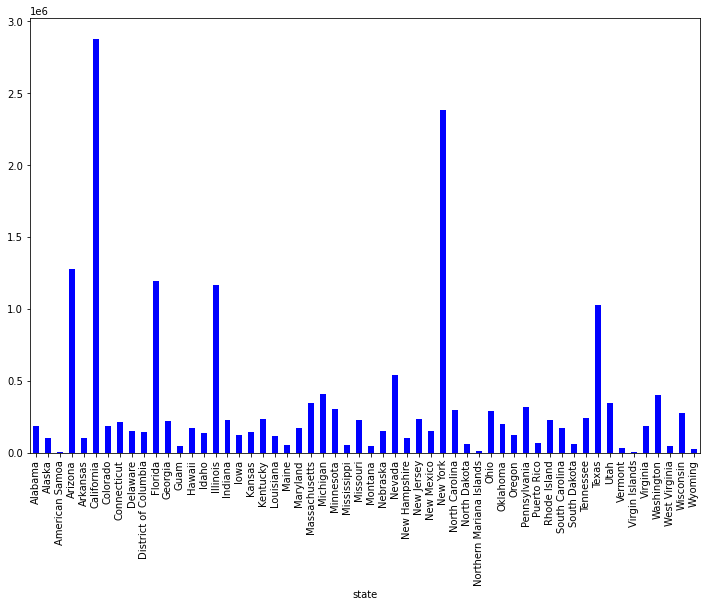

In [0]:
plt.figure(figsize=(12,8)) # Fix the Figure size
pandas_df_counties_one.groupby("state")['cases'].max().plot(kind='bar', color='blue')
# Code to loop through and print the number of cases on top of the plot for each instance, however this is not clear enough, so omiitted.
# for p in ax.patches:
#     ax.annotate(f'\n{p.get_height()}', (p.get_x()+0.6, p.get_height()), ha='center', va='top', color='black', size=18)


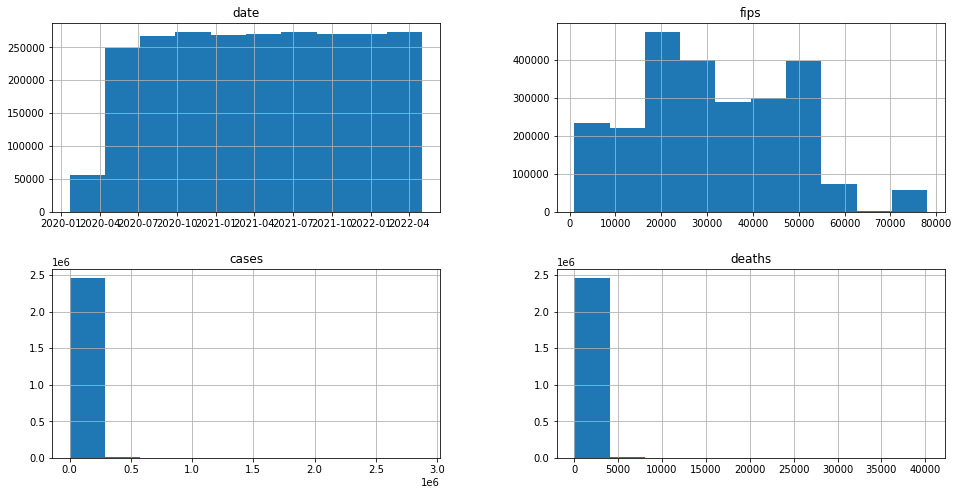

In [0]:
pandas_df_counties_one.hist(figsize = (16, 8))
plt.show()

In [0]:
# Let's check how many unique states do we have
print(f"{pandas_df_counties_one['state'].nunique()} states are present in this dataset")


56 states are present in this dataset


In [0]:
print(f"{pandas_df_counties_one['county'].nunique()} counties are present in this dataset")


1932 counties are present in this dataset


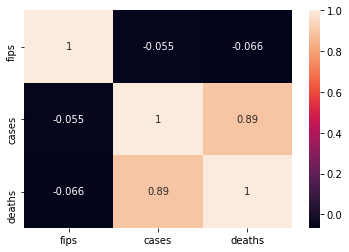

In [0]:
# Since we are working with pandas, we can see the complete correlation matrix to understand the coefficient of correlation amongst different columns.
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
sns.heatmap(pandas_df_counties_one.corr(), annot=True)
plt.show()

In [0]:
# Taking too long to run, skipped.
#import plotly.express as px
#fig = px.scatter(pandas_df_counties_one, x="cases", y="state", 
#                 color="cases", 
#                 hover_data=['deaths','county', 'date', 'fips'], 
#                 title = "Total number of Cases")
#fig.show()


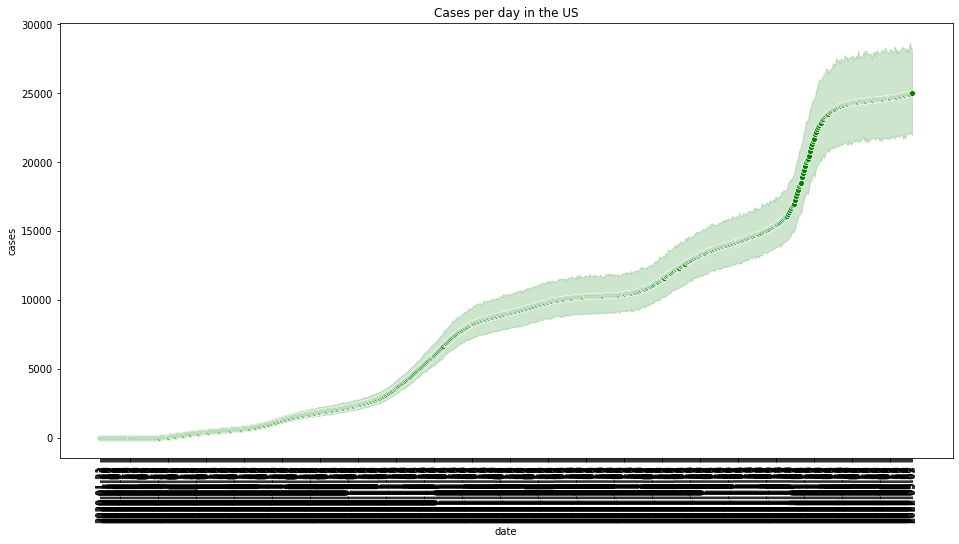

In [0]:
# Let's visualize how the cases are being distributed ac
plt.figure(figsize=(16,8)) # Size of the figure
sns.lineplot(x='date', y='cases', data=pandas_df_counties_one, marker='o', color='green') 
plt.title('Cases per day in the US') # Title
plt.xticks(pandas_df_counties_one.date.unique(), rotation=90) 
plt.show()


In [0]:
# Deaths scatter plot. However taking too long to run, therefore omitted.
# death_fig = px.scatter(pandas_df_counties_one, x="deaths", y="state", 
#                  color="cases", 
#                  hover_data=['cases','county', 'date', 'fips'], 
#                  title = "Deaths")
# death_fig.show()

In [0]:
# Let's sort the states by the number of deaths that have unfortunately occurred in the highest recurring county
deaths_for_each_state = pandas_df_counties_one.sort_values('deaths', ascending=False)
state_wise_deaths = deaths_for_each_state.drop_duplicates(subset="state", keep='first', inplace=True) 
state_wise_deaths = deaths_for_each_state.nlargest(56, 'deaths').reset_index()

state_wise_deaths

,index,date,county,state,fips,cases,deaths
0,2468879,2022-05-03,New York City,New York,NaN,2381364,40210
1,2467203,2022-05-03,Los Angeles,California,6037.0,2880521,31977
2,2463846,2022-05-02,Maricopa,Arizona,4013.0,1277230,17153
3,2467615,2022-05-03,Cook,Illinois,17031.0,1167319,14906
4,1703289,2021-09-10,Unknown,Florida,NaN,2,11799
5,2469730,2022-05-03,Harris,Texas,48201.0,1025760,10953
6,2459001,2022-04-30,Clark,Nevada,32003.0,539351,8421
7,2455303,2022-04-29,Wayne,Michigan,26163.0,406822,7942
8,2469320,2022-05-03,Philadelphia,Pennsylvania,42101.0,314253,5103
9,2299005,2022-03-12,Middlesex,Massachusetts,25017.0,319742,4726


In [0]:
# Let's now just visualize the top 15 most effected states in terms of deaths recorded using the county data
top_15_worst_hit_states = state_wise_deaths[:15]
top_15_worst_hit_states

,index,date,county,state,fips,cases,deaths
0,2468879,2022-05-03,New York City,New York,NaN,2381364,40210
1,2467203,2022-05-03,Los Angeles,California,6037.0,2880521,31977
2,2463846,2022-05-02,Maricopa,Arizona,4013.0,1277230,17153
3,2467615,2022-05-03,Cook,Illinois,17031.0,1167319,14906
4,1703289,2021-09-10,Unknown,Florida,NaN,2,11799
5,2469730,2022-05-03,Harris,Texas,48201.0,1025760,10953
6,2459001,2022-04-30,Clark,Nevada,32003.0,539351,8421
7,2455303,2022-04-29,Wayne,Michigan,26163.0,406822,7942
8,2469320,2022-05-03,Philadelphia,Pennsylvania,42101.0,314253,5103
9,2299005,2022-03-12,Middlesex,Massachusetts,25017.0,319742,4726


/databricks/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
Out[82]: Text(0.5, 1.0, '15 worst hit states')

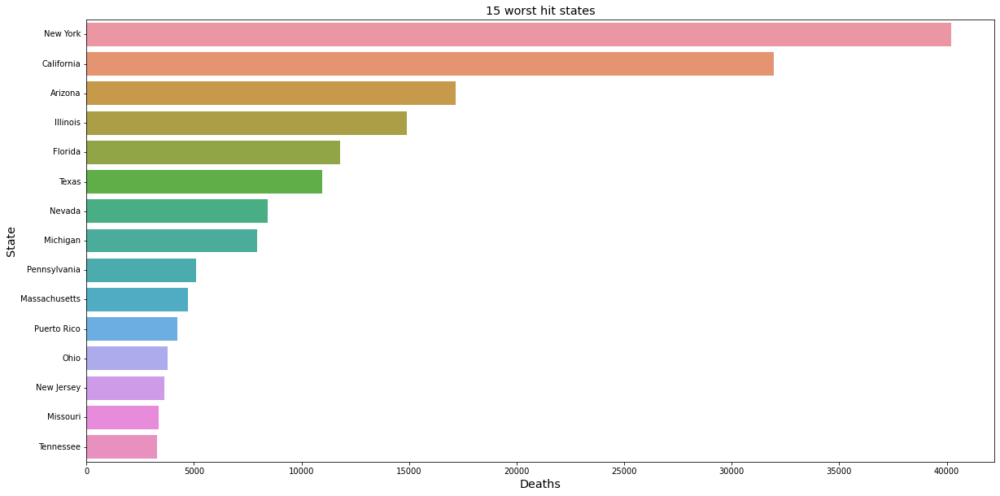

In [0]:
# Let's visualize the top 15 worst hit states in terms of deaths 
plt.figure(figsize=(20,10))
chart = sns.barplot(top_15_worst_hit_states['deaths'], top_15_worst_hit_states['state'])
plt.xticks(horizontalalignment='center',fontsize='medium')
plt.yticks(verticalalignment='center',fontsize='medium')
plt.xlabel(xlabel='Deaths', fontsize='x-large')
plt.ylabel(ylabel='State', fontsize='x-large')
plt.title('15 worst hit states', fontsize='x-large')


In [0]:
# Let's sort the counties by the number of deaths that have unfortunately occurred, this is basically the same grouping as the states, but subset is replaced by counties.
# deaths_for_each county = pandas_df_counties_one.sort_values('deaths', ascending=False)
# county_wise_deaths = deaths_for_each_county.drop_duplicates(subset="county", keep='first', inplace=True) 
# county_wise_deaths = deaths_for_each_county.nlargest(1932, 'deaths').reset_index()

deaths_for_each_county = pandas_df_counties_one.sort_values('deaths', ascending=False)
county_wise_deaths = deaths_for_each_county.drop_duplicates(subset="county", keep='first', inplace=True) 
county_wise_deaths = deaths_for_each_county.nlargest(1913, 'deaths').reset_index()

county_wise_deaths


,index,date,county,state,fips,cases,deaths
0,2468879,2022-05-03,New York City,New York,NaN,2381364,40210
1,2467203,2022-05-03,Los Angeles,California,6037.0,2880521,31977
2,2463846,2022-05-02,Maricopa,Arizona,4013.0,1277230,17153
3,2467615,2022-05-03,Cook,Illinois,17031.0,1167319,14906
4,1703289,2021-09-10,Unknown,Florida,NaN,2,11799
...,...,...,...,...,...,...,...
1908,1604603,2021-08-10,Trujillo Alto,Puerto Rico,72139.0,3922,0
1909,1029937,2021-02-14,Toa Baja,Puerto Rico,72137.0,3765,0
1910,1016951,2021-02-10,San Lorenzo,Puerto Rico,72129.0,1419,0
1911,1016952,2021-02-10,San Sebastian,Puerto Rico,72131.0,1630,0


In [0]:
# Let's now just visualize the top 15 most effected counties in terms of deaths recorded using the county data.
# This visual is slighty more insightful as we can see that there are multiple counties within each state like Texas which are badly effected and this could go unoticed when grouping  using state.
county_wise_deaths = county_wise_deaths[:15]
county_wise_deaths

,index,date,county,state,fips,cases,deaths
0,2468879,2022-05-03,New York City,New York,NaN,2381364,40210
1,2467203,2022-05-03,Los Angeles,California,6037.0,2880521,31977
2,2463846,2022-05-02,Maricopa,Arizona,4013.0,1277230,17153
3,2467615,2022-05-03,Cook,Illinois,17031.0,1167319,14906
4,1703289,2021-09-10,Unknown,Florida,NaN,2,11799
5,2469730,2022-05-03,Harris,Texas,48201.0,1025760,10953
6,2460852,2022-05-01,Miami-Dade,Florida,12086.0,1192800,10895
7,2459001,2022-04-30,Clark,Nevada,32003.0,539351,8421
8,2455303,2022-04-29,Wayne,Michigan,26163.0,406822,7942
9,2467220,2022-05-03,San Bernardino,California,6071.0,594674,7240


/databricks/python/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
Out[85]: Text(0.5, 1.0, 'Top 15 worst hit Counties')

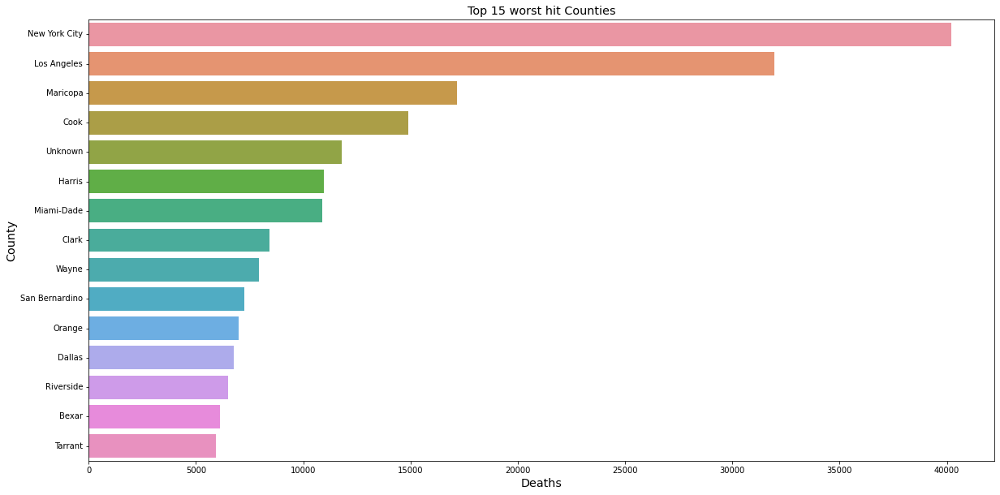

In [0]:
# Let's visualize the top 15 worst hit counties in terms of deaths 
plt.figure(figsize=(20,10))
chart = sns.barplot(county_wise_deaths['deaths'], county_wise_deaths['county'])
plt.xticks(horizontalalignment='center',fontsize='medium')
plt.yticks(verticalalignment='center',fontsize='medium')
plt.xlabel(xlabel='Deaths', fontsize='x-large')
plt.ylabel(ylabel='County', fontsize='x-large')
plt.title('Top 15 worst hit Counties', fontsize='x-large')

In [0]:
pandas_df_counties_three = pandas_df_counties_one.copy()
pandas_df_counties_three = pandas_df_counties_one.groupby('date').sum()
pandas_df_counties_three.head()

,fips,cases,deaths
date,,,
2020-01-21,53061.0,1,0
2020-01-22,53061.0,1,0
2020-01-23,53061.0,1,0
2020-01-24,70092.0,2,0
2020-01-25,76151.0,3,0


In [0]:
# Initially let's just plot cases of counties with time. Instead of a standard plot, let's try an interactive plot to see how cases and deaths vary over time

# from plotly import download_plotlyjs, init_notebook_mode, plot, iplot
# import plotly
# import cufflinks as cf
# cf.go_offline()
# cf.set_config_file(offline=False, world_readable=True)
pd.options.plotting.backend = "plotly"
pandas_df_counties_three[['cases','deaths']].plot(title = 'US Counties Cases vs Deaths over time')


### Now let's try to visualise top 10 worst hit counties sorted by each state

In [0]:
high_deaths_states = pandas_df_counties_one.groupby(['state','date'])['cases','deaths'].sum()
high_deaths_states=high_deaths_states.sort_values('date')
high_deaths_states=high_deaths_states.reset_index()
high_deaths_states=high_deaths_states.query('deaths > =15000')
high_deaths_states.head()

<command-2129236520000166>:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,state,date,cases,deaths
2459,New York,2020-04-16,225761,15669
2497,New York,2020-04-17,233293,16473
2565,New York,2020-04-18,240542,17141
2653,New York,2020-04-19,246741,17793
2671,New York,2020-04-20,251608,18412


In [0]:
# Plotted a Scatter plot with the given data and we can now visually see the underlying trend that our data is trying to convey. Can clearly see the much talked about trend on how cases in California have surged since the turn of the year. Can observe it interactively as well by pointing the cursor towards it.
figure_cases=px.scatter(high_deaths_states,x='date',y='cases',color='state')
figure_cases.update_layout(
    title_text='Visualization of Cases in states of USA'
)
figure_cases.show()

In [0]:
figure_deaths=px.scatter(high_deaths_states,x='date',y='deaths',color='state')
figure_deaths.update_layout(
    title_text='Visualization of deaths in the states of USA'
)
figure_deaths.show()

In [0]:
county_cases_temp = pandas_df_counties_one.copy()
county_cases = county_cases_temp.groupby(['state','county','date'])['state','county','cases','deaths'].sum()
county_cases = county_cases.reset_index()
county_cases = county_cases.sort_values('cases',ascending=False)
county_cases.head()

<command-2129236520000167>:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,state,county,date,cases,deaths
156937,California,Los Angeles,2022-05-03,2880521,31977
156936,California,Los Angeles,2022-05-02,2878664,31970
156935,California,Los Angeles,2022-05-01,2872907,31959
156933,California,Los Angeles,2022-04-29,2872907,31959
156934,California,Los Angeles,2022-04-30,2872907,31959


In [0]:
# Since I am currently residing in Minnesota and have happened to like this place, performing state wise analysis of Minnesota can be our next option!
# Let's start off by understanding the top 5 most effected counties in Minnesota
mn_county_cases_max=county_cases.query('state=="Minnesota"')
mn_county_cases_max=mn_county_cases_max.groupby(['state','county']).max()
mn_county_cases_max=mn_county_cases_max.reset_index()
mn_county_cases_max=mn_county_cases_max.sort_values('deaths',ascending=False)
mn_county_cases_max.head()

,state,county,date,cases,deaths
26,Minnesota,Hennepin,2022-05-03,306229,2585
61,Minnesota,Ramsey,2022-05-03,126543,1337
1,Minnesota,Anoka,2022-05-03,99521,795
18,Minnesota,Dakota,2022-05-03,111793,772
71,Minnesota,St. Louis,2022-05-03,47702,531


In [0]:
mn_county_cases_max=county_cases.query('state=="Minnesota"')
mn_county_cases_max=mn_county_cases_max.groupby(['county','date']).max()
mn_county_cases_max=mn_county_cases_max.reset_index()
mn_county_cases_max=mn_county_cases_max.sort_values('deaths',ascending=False)
mn_county_cases_max.head()

,county,date,state,cases,deaths
20663,Hennepin,2022-05-03,Minnesota,306229,2585
20662,Hennepin,2022-05-02,Minnesota,305401,2585
20661,Hennepin,2022-05-01,Minnesota,304826,2585
20660,Hennepin,2022-04-30,Minnesota,304826,2585
20659,Hennepin,2022-04-29,Minnesota,304826,2585


In [0]:
# LEt's visualise the effect of the virus in Minnesotan counties
fig_mn_cases = px.line(mn_county_cases_max,x='date',y='cases',color='county')
fig_mn_cases.update_layout(
    title_text='Visualisation of cases in Minnesotan Counties'
)
fig_mn_cases.show()

In [0]:
fig_mn_deaths = px.line(mn_county_cases_max,x='date',y='deaths',color='county')
fig_mn_deaths.update_layout(
    title_text='Visualisation of the sad deaths in Minnesotan Counties'
)
fig_mn_deaths.show()

In [0]:
# LEt's try to visualize the deaths in a scatter plot style to see how the data is distributed.
# import itertools

# colors = itertools.cycle(["r", "b", "g"])
# for y in ys:
#     plt.scatter(x, y, color=next(colors))
fig_mn_deaths_two=px.scatter(mn_county_cases_max,x=mn_county_cases_max['county'],y=mn_county_cases_max['deaths'],size=mn_county_cases_max['deaths'],color=mn_county_cases_max['deaths'])
fig_mn_deaths.update_layout(
    title_text='Visualisation of the sad deaths in Minnesotan Counties'
)
fig_mn_deaths_two.show()

In [0]:
# Since Wisconsin is a nearby state, sharing rivalries across many fronts, let's investigate the cases in Wisconsin counties as well to get a comparison
wi_county_cases_max = county_cases.query('state=="Wisconsin"')
wi_county_cases_max = wi_county_cases_max.groupby(['county','date']).max()
wi_county_cases_max = wi_county_cases_max.reset_index()
wi_county_cases_max = wi_county_cases_max.sort_values('deaths',ascending=False)
wi_county_cases_max.head()

,county,date,state,cases,deaths
31408,Milwaukee,2022-05-03,Wisconsin,273336,2287
31400,Milwaukee,2022-04-25,Wisconsin,271352,2286
31407,Milwaukee,2022-05-02,Wisconsin,273146,2286
31406,Milwaukee,2022-05-01,Wisconsin,272470,2286
31405,Milwaukee,2022-04-30,Wisconsin,272470,2286


In [0]:
# Let's visualise the effect of the virus in the counties of Wisconsin
fig_wi_cases = px.line(wi_county_cases_max,x='date',y='cases',color='county')
fig_wi_cases.update_layout(
    title_text='Visualisation of cases in Wisconsin Counties'
)
fig_wi_cases.show()

In [0]:
# Visualising the sad deaths in Wisconsin counties
fig_wi_deaths = px.line(wi_county_cases_max,x='date',y='deaths',color='county')
fig_wi_deaths.update_layout(
    title_text='Visualisation of the sad deaths in Wisconsin Counties'
)
fig_wi_deaths.show()

In [0]:
# LEt's visually compare the 2 worst hit states, i.e. California and New York  using this county data. In this snippet, we are evaluating and filtering NY data
county_cases_temp2 = county_cases_temp.copy()
new_york_cases = county_cases_temp2[county_cases_temp2['state']=='New York']
new_york_cases=new_york_cases.groupby(['county','date']).sum()
new_york_cases=new_york_cases.reset_index()
new_york_cases=new_york_cases.set_index('date')
new_york_cases.index = pd.to_datetime(new_york_cases.index)
new_york_cases=new_york_cases.resample('W').max()
new_york_cases

,county,fips,cases,deaths
date,,,,
2020-03-01,New York City,0.0,1,0
2020-03-08,Westchester,36119.0,81,0
2020-03-15,Westchester,36119.0,330,5
2020-03-22,Wyoming,36121.0,9065,119
2020-03-29,Wyoming,36121.0,33983,991
...,...,...,...,...
2022-04-10,Yates,36123.0,2320951,40104
2022-04-17,Yates,36123.0,2336249,40133
2022-04-24,Yates,36123.0,2353829,40167


In [0]:
# In this cell we are filtering and grouping w.r.t. California data
county_cases_temp3 = county_cases_temp.copy()
california_cases = county_cases_temp3[county_cases_temp2['state']=='California']
california_cases = california_cases.groupby(['county','date']).sum()
california_cases =california_cases.reset_index()
california_cases =california_cases.set_index('date')
california_cases.index = pd.to_datetime(california_cases.index)
california_cases=california_cases.resample('W').max()
california_cases

,county,fips,cases,deaths
date,,,,
2020-01-26,Orange,6059.0,1,0
2020-02-02,Santa Clara,6085.0,2,0
2020-02-09,Santa Clara,6085.0,2,0
2020-02-16,Santa Clara,6085.0,2,0
2020-02-23,Santa Clara,6085.0,2,0
...,...,...,...,...
2022-04-10,Yuba,6115.0,2844303,31770
2022-04-17,Yuba,6115.0,2851184,31852
2022-04-24,Yuba,6115.0,2860503,31924


In [0]:
# Let's intutively merge these 2 tables we have created for more potent analysis
two_worst_hit_states = pd.merge(new_york_cases,california_cases,how='left' ,left_index=True, right_index=True)
two_worst_hit_states=two_worst_hit_states.fillna(0)
two_worst_hit_states=two_worst_hit_states.reset_index()
two_worst_hit_states

,date,county_x,fips_x,cases_x,deaths_x,county_y,fips_y,cases_y,deaths_y
0,2020-03-01,New York City,0.0,1,0,Sonoma,6097.0,12,0
1,2020-03-08,Westchester,36119.0,81,0,Yolo,6113.0,37,1
2,2020-03-15,Westchester,36119.0,330,5,Yolo,6113.0,114,2
3,2020-03-22,Wyoming,36121.0,9065,119,Yuba,6115.0,421,11
4,2020-03-29,Wyoming,36121.0,33983,991,Yuba,6115.0,2136,37
...,...,...,...,...,...,...,...,...,...
110,2022-04-10,Yates,36123.0,2320951,40104,Yuba,6115.0,2844303,31770
111,2022-04-17,Yates,36123.0,2336249,40133,Yuba,6115.0,2851184,31852
112,2022-04-24,Yates,36123.0,2353829,40167,Yuba,6115.0,2860503,31924
113,2022-05-01,Yates,36123.0,2370380,40199,Yuba,6115.0,2872907,31959


In [0]:
from pylab import rcParams
%matplotlib notebook

rcParams['figure.figsize'] = 14, 8
two_worst_hit_states.plot(kind='line',y=['cases_x','cases_y'],x='date',labels=['Cases in New York','Cases in California'])

#plt.show()


### #Commented code for future use

In [0]:
# Alternative way of counting nulls and nans: By implementing a function in spark: This code worked and gave the same result

# import pyspark.sql.functions as F
# def count_missings(spark_df,sort=True):
#     """
#     Counts number of nulls and nans in each column
#     """
#     df = spark_df.select([F.count(F.when(F.isnan(c) | F.isnull(c), c)).alias(c) for (c,c_type) in spark_df.dtypes if c_type not in ('timestamp', 'string', 'date')]).toPandas()

#     if len(df) == 0:
#         print("There are no any missing values!")
#         return None

#     if sort:
#         return df.rename(index={0: 'count'}).T.sort_values("count",ascending=False)

#     return df

In [0]:
#pandas_df_counties_four = pandas_df_counties_one.copy()

In [0]:
# pandas_df_counties_two['date']=pd.to_datetime(pandas_df_counties_two['date'],yearfirst=True)
# pandas_df_counties_two.set_index('date',inplace=True)


In [0]:
# pandas_df_counties_two.dtypes

In [0]:
# Code to try and implement month wise predictions
# dates=[]
# data=[]
# dates.append('January')
# data.append(pandas_df_counties_two.loc[pandas_df_counties_two.index==pd.Timestamp('2022-01-31')]['cases'].sum())

# dates.append('February')
# data.append(pandas_df_counties_two.loc[pandas_df_counties_two.index==pd.Timestamp('2022-02-29')]['cases'].sum()-data[0])

# dates.append('March')
# data.append(pandas_df_counties_two.loc[pandas_df_counties_two.index==pd.Timestamp('2022-03-31')]['cases'].sum()-data[1])

# dates.append('April')
# data.append(pandas_df_counties_two.loc[pandas_df_counties_two.index==pd.Timestamp('2022-04-30')]['cases'].sum()-data[2])

# dates.append('May')
# data.append(pandas_df_counties_two.loc[pandas_df_counties_two.index==pd.Timestamp('2022-05-31')]['cases'].sum()-data[3])


In [0]:

# pandas_df_counties_one = covid_df_counties_raw.toPandas()
# print(pandas_df_counties_one)


In [0]:
# feature_list = ["fips", "date", "cases", "deaths"]
# # feature selection
# pandas_df_counties_one = pandas_df_counties_one[feature_list]
# pandas_df_counties_one = pandas_df_counties_one.dropna(subset=feature_list)

In [0]:
# Population estimate code
# pandas_df_counties_one = pandas_df_counties_one.astype(dtype={"cases": float,
#                                       "fips" : str,
#                                       "deaths": float,
#                                       "date": "datetime64[ns]"})
# pandas_df_counties_one['fips'] = pandas_df_counties_one['fips'].astype('|S') # which will by default set the length to the max len it encounters

# print(pandas_df_counties_one.dtypes)

In [0]:
# pandas_df_popestimate_one = population_estimate_raw.toPandas()
# print(pandas_df_popestimate_one)

In [0]:
# print(pandas_df_popestimate_one['STATE'].dtype)
# print(pandas_df_popestimate_one['COUNTY'].dtype)


In [0]:
#  # columns to keep
# feature_list = ["fips", "POPESTIMATE2019"]

# # create fips code by concatenating STATE and COUNTY codes
# pandas_df_popestimate_one["fips"] = pandas_df_popestimate_one["STATE"].astype(str).str.strip() \
#         + pandas_df_popestimate_one["COUNTY"].astype(str).str.strip()

# pandas_df_popestimate_one = pandas_df_popestimate_one.astype(dtype={"POPESTIMATE2019": float})
# #pandas_df_popestimate_one = pandas_df_popestimate_one.astype(dtype={"fips": str})
# pandas_df_popestimate_one['fips'] = pandas_df_popestimate_one['fips'].astype('|S') # which will by default set the length to the max len it encounters


In [0]:
# print(pandas_df_popestimate_one)

In [0]:
# print(pandas_df_popestimate_one['fips'].dtype)
# print(pandas_df_counties_one['fips'].dtype)

In [0]:
# combined_df_one = pandas_df_counties_one.merge(pandas_df_popestimate_one, on="fips", how="left")

# feature_list = ["fips", "date", "cases", "deaths", "POPESTIMATE2019"]
# print(combined_df_one[feature_list])